# Preview Notebook

This notebook serves demonstration purposes.

In [17]:
from datasets import DisectedSet

import torch
import torch.nn as nn
import matplotlib.pyplot as plt
from torch.utils.data import DataLoader

from functional import visualize_input_tensor, crop_mse, visualize_results

In [18]:
dataset = DisectedSet('data/processed/eval')
loader = DataLoader(dataset)

In [23]:
model = torch.load('models/final.pt')

## What do input tensors look like?

Images are being loaded into a tensor consisting of the following layers

-----

    ├── Image with certain rectangle cropped out 
    ├── Boolean Array indicating cropped out area    
    ├── Array indicating horizontal position           
    ├── Array indicating vertical position  

-----

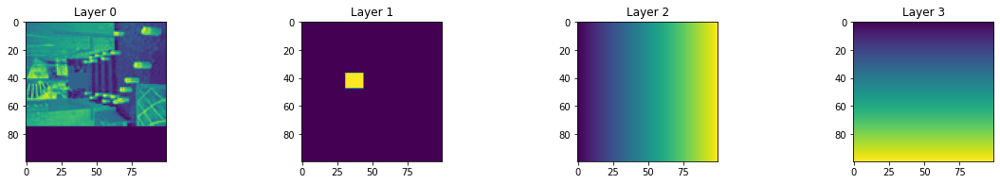

In [20]:
input_tensor, original = dataset[0]
visualize_input_tensor(input_tensor)

### Model Architecture

In [21]:
model

UNet(
  (encoders): Sequential(
    (0): Encoder(
      (model): Sequential(
        (0): Conv2d(4, 8, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
        (1): SELU()
      )
    )
    (1): Encoder(
      (model): Sequential(
        (0): Conv2d(8, 16, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
        (1): SELU()
      )
    )
    (2): Encoder(
      (model): Sequential(
        (0): Conv2d(16, 32, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
        (1): SELU()
      )
    )
    (3): Encoder(
      (model): Sequential(
        (0): Conv2d(32, 64, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
        (1): SELU()
      )
    )
    (4): Encoder(
      (model): Sequential(
        (0): Conv2d(64, 128, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
        (1): SELU()
      )
    )
  )
  (decoders): Sequential(
    (0): Decoder(
      (model): Sequential(
        (0): ConvTranspose2d(128, 64, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
        (1): SEL

## First 100 images of the Evaluation Set

(Note: Sadly, I do not have the data any longer, and the outputs here were of a somewhat )

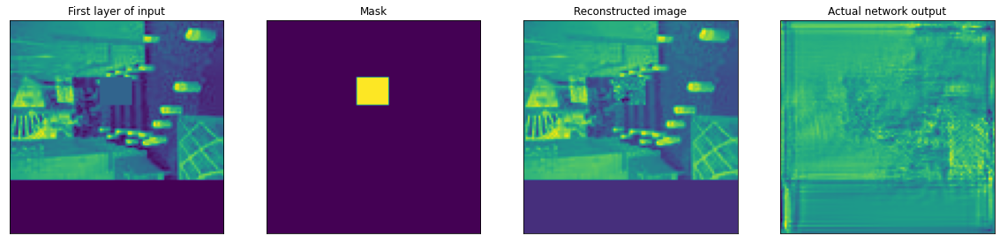

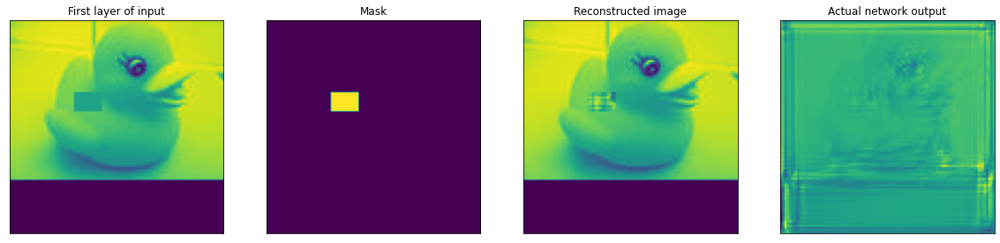

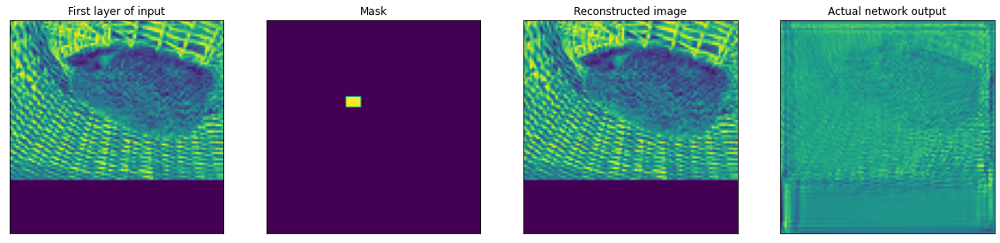

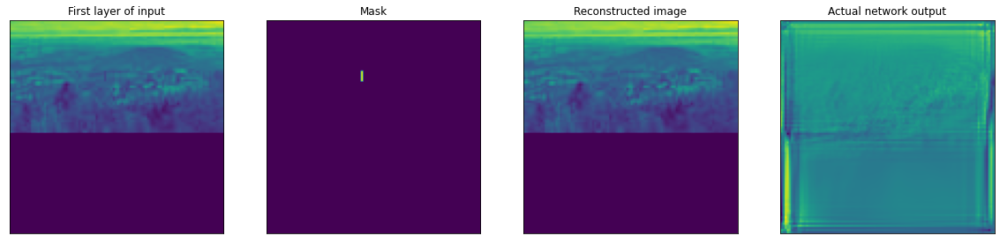

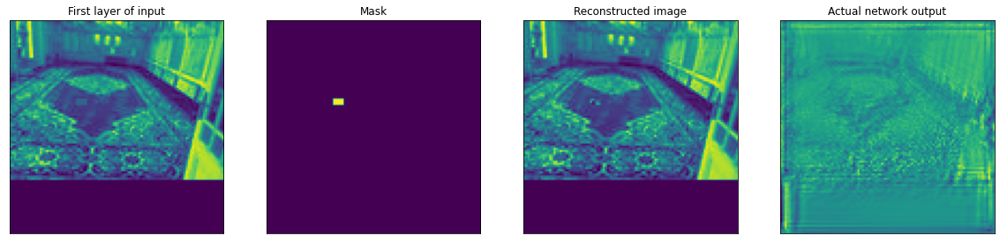

...

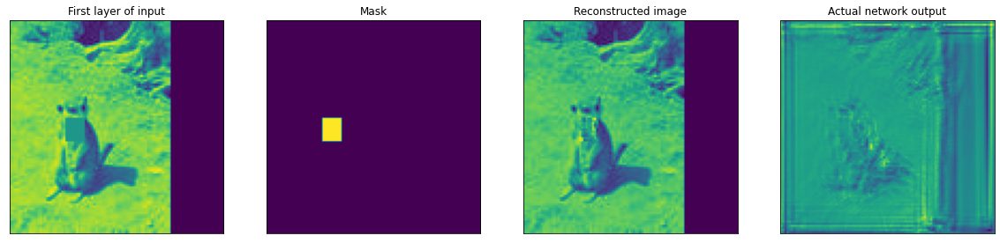

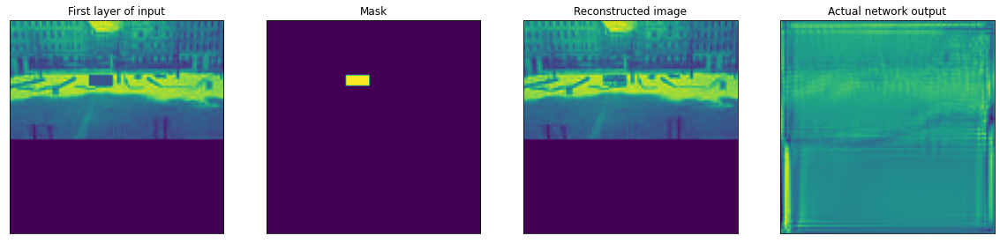

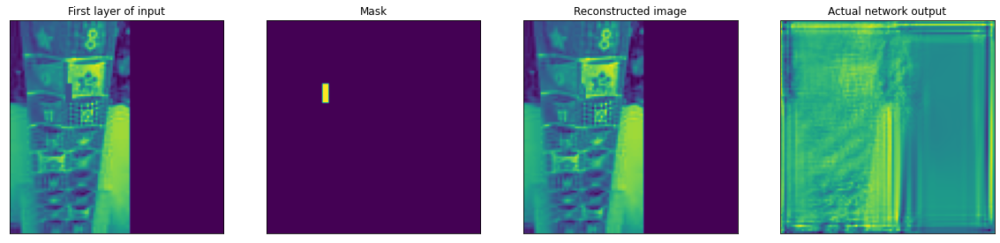

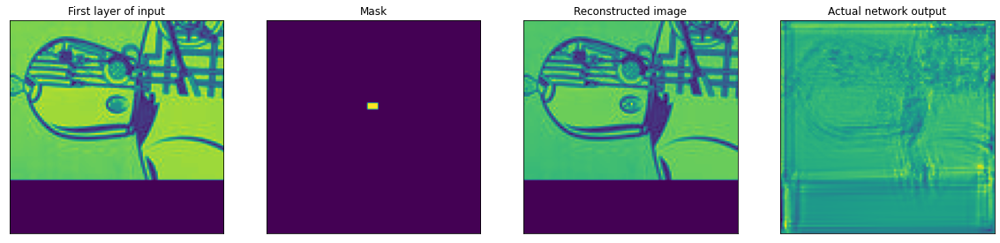

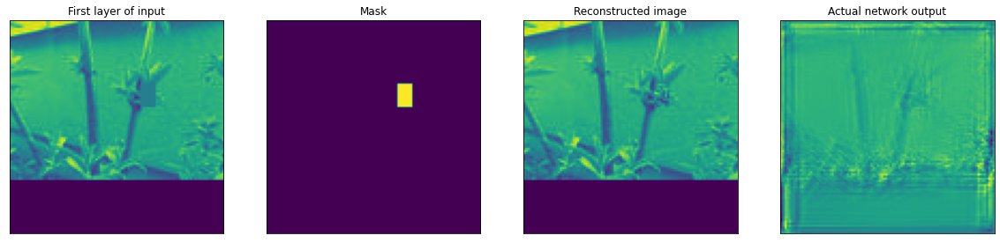

In [24]:
for i, batch in enumerate(loader):
    input_tensor, original = batch
    out = model(input_tensor.cuda())
    visualize_results(batch, out)
    if i == 100: break